In [46]:
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from keras.callbacks import TensorBoard
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import sys
from skimage.transform import resize
from skimage.measure import label, regionprops
from skimage.segmentation import clear_border
from skimage.util import crop
from skimage.io import imsave, imread
from skimage.morphology import (erosion, dilation, opening, closing, white_tophat)
from skimage.morphology import disk
from skimage.io import imsave
import time


sys.path.append('../src')
import unet7
from custom_keras_class import *

In [47]:
K.set_image_data_format('channels_last')  # TF dimension ordering in this code

img_cols = 1392
img_rows = 1040
epochs = 10 #100 1001
batch_size = 7
smooth = 1.
start_lr = 1e-4
target_width = 256
target_height = 256

upscale_factor_width = img_cols / target_width
upscale_factor_height = img_cols / target_height

In [48]:
# import neptune.new as neptune
# from neptune.new.types import File

# run = neptune.init(
#     project="mlid/DeepUTI",
#     api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiI0Y2JmNWIzMS1hYmMyLTQ2ODUtODVmNy02MWJiNzBlODQ0M2MifQ==",  
# )

In [49]:
# parameters = {
#     "img_cols": 1392,
#     "img_rows": 1040,
#     "epochs": 1,
#     "batch_size": 80,
#     "smooth": 1.,
#     "start_lr": 1e-4,
#     "target_width": 256,
#     "target_height": 256,
#     "upscale_factor_width": img_cols/ target_width,
#     "upscale_factor_height": img_cols/ target_height
# }

# run["model/parameters"] = parameters

In [50]:
def checkDir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)
        
def read_imgs(dir, img_rows, img_cols):
    images = [f for f in os.listdir(dir) if f.endswith('.tif')]
    imgs = np.ndarray((len(images), img_rows, img_cols, 1), dtype=np.float)
    for idx, img in enumerate(images):
        #print(idx)
        img = imread(os.path.join(dir, img), as_gray=True)
        img = np.expand_dims(img, axis=-1)
        imgs[idx] = img
    return imgs

def test_model(model, x, y_true, log_dir):
    y_true = np.rint(y_true[0])
    y_pred = model.predict(x)
    y_pred = np.rint(y_pred[0])
    x = x[0]

    plt.figure(figsize=(40,8))
    plt.subplot(1, 3, 1)
    plt.title('Input')
    plt.imshow(np.squeeze(x))

    plt.subplot(1, 3, 2)
    plt.title('Prediction')
    plt.imshow(np.squeeze(y_pred))

    plt.subplot(1, 3, 3)
    plt.title('Ground truth')
    plt.imshow(np.squeeze(y_true))

    plt.savefig(os.path.join(log_dir,'ground_truth_e{}.png'.format('test')), bbox_inches='tight', dpi=300)
    plt.show()

In [51]:
runningTime = time.strftime('%b-%d-%Y_%H-%M')
model_dir = os.path.join('..','data')
log_dir = os.path.join(model_dir, 'Practice','logs',"{}".format(runningTime))
checkDir(log_dir)

In [52]:
# Add additional parameters
# run["model/parameters/runningTime"] = runningTime
# run["model/parameters/model_dir"] = model_dir
# run["model/parameters/log_dir"] = log_dir

# Update parameters. For example, after triggering early stopping
# run["model/parameters/n_epochs"] = epoch

In [53]:
# Update parameters. For example, after triggering early stopping
# run["model/parameters/upscale_factor_height"] = img_rows/ target_height

In [54]:
# from neptune.new.integrations.tensorflow_keras import NeptuneCallback

In [55]:
# Training


tensorboard = TensorBoard(log_dir=os.path.join(model_dir,"{}".format(runningTime)))
#tensorboard = TensorBoard(log_dir=log_dir)

# callbacksList = [tensorboard,NeptuneCallback(run=run)]
callbacksList = [tensorboard]

#model = unet7.get_unet(img_cols, img_rows)
model = unet7.Unet(target_width, target_width, nclasses=1)

#model.compile(optimizer=Adam(lr=5e-5), loss=unet7.dice_coef_loss, metrics=[unet7.dice_coef])
model.compile(optimizer=Adam(learning_rate=start_lr), loss=unet7.dice_loss, metrics=[unet7.dice_coeff],run_eagerly=True)

model.summary()
#print("start tensorboard, cmd: tensorboard --logdir=\""+os.path.join(model_dir,"{}".format(runningTime)+"\""))
print("start tensorboard, cmd: tensorboard --logdir=\""+os.path.join(log_dir+"\""))

Model: "Unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image_input (InputLayer)       [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 256, 256, 8)  80          ['image_input[0][0]']            
                                                                                                  
 batch_normalization_19 (BatchN  (None, 256, 256, 8)  32         ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                               

In [56]:
training_img_dir = os.path.join(model_dir,'train','img')
training_mask_dir = os.path.join(model_dir,'train','mask')
test_img_dir = os.path.join(model_dir,'test','img')
test_mask_dir = os.path.join(model_dir,'test','mask')

In [57]:
def read_imgs_masks(img_dir, mask_dir, img_rows, img_cols,
                    target_width=img_cols, target_height=img_rows):
    images = [f for f in os.listdir(img_dir) if f.endswith('.tif')]
    imgs = np.ndarray((len(images), target_height, target_width, 1), dtype=np.float64)
    masks = np.ndarray((len(images), target_height, target_width, 1), dtype=np.float64)
    for idx, img in enumerate(images):
        #print(idx)
        msk = img.replace('.tif', '_Simple Segmentation.tif')
        img = imread(os.path.join(img_dir, img), as_gray=True)
        # img = resize(img, (target_height, target_width))
        img = np.expand_dims(img, axis=-1)
        imgs[idx] = img
        
        mask = imread(os.path.join(mask_dir, msk), as_gray=True)
        # mask = resize(mask, (target_height, target_width))
        mask = np.expand_dims(mask, axis=-1)
        masks[idx] = mask
    return imgs, masks

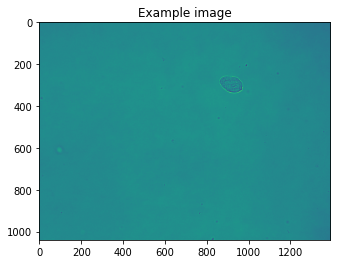

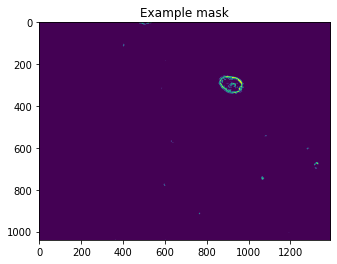

In [58]:
# load training images

training_imgs, training_masks= read_imgs_masks(training_img_dir, training_mask_dir, img_rows, img_cols)
plt.figure()
plt.title('Example image')
plt.imshow(np.squeeze(training_imgs[0]))

training_imgs = training_imgs.astype('float32')
training_imgs = training_imgs / training_imgs.max()

training_masks = training_masks.astype('float32')
training_masks = np.where(training_masks > 0.5, 1, 0)

plt.figure()
plt.title('Example mask')
plt.imshow(np.squeeze(training_masks[0]))

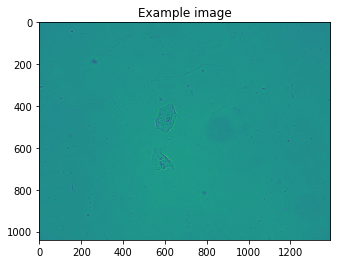

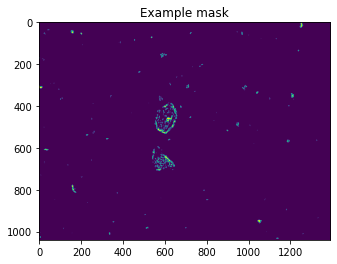

In [59]:
test_imgs, test_masks= read_imgs_masks(test_img_dir, test_mask_dir, img_rows, img_cols)
plt.figure()
plt.title('Example image')
plt.imshow(np.squeeze(test_imgs[0]))

test_imgs = test_imgs.astype('float32')
test_imgs = test_imgs / test_imgs.max()

test_masks = test_masks.astype('float32')
test_masks = np.where(test_masks > 0.5, 1, 0)

plt.figure()
plt.title('Example mask')
plt.imshow(np.squeeze(test_masks[0]))

In [60]:
training_imgs.shape

(7, 1040, 1392, 1)

In [61]:
test_imgs.shape

(3, 1040, 1392, 1)

In [62]:
# np.savez('../data/030622_full_res_dataset_sample.npz', training_imgs=training_imgs,
#                                  training_masks=training_masks,
#                                  test_imgs=test_imgs,
#                                  test_masks=test_masks)

In [63]:
data = np.load('../data/030622_full_res_dataset_sample.npz')
training_imgs=data['training_imgs']
training_masks=data['training_masks']
test_imgs=data['test_imgs']
test_masks=data['test_masks']
del data

In [64]:
# You can upload image from the disc
# run["val/conf_matrix"].upload("confusion_matrix.png")

# You can also upload plot objects directly
# run["val/roc_curve"].upload(plt_fig_roc)

# from neptune.new.types import File

# # You can upload image series from the disc
# for image_path in misclassified_images_paths:
#     run["valid/misclassified"].log(File(image_path))

# # You can also upload plot objects directly
# for epoch in range(params["iterations"]):
#     plt_fig = get_histogram()
#     run["train/distribution"].log(plt_fig)

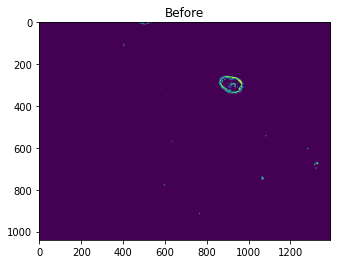

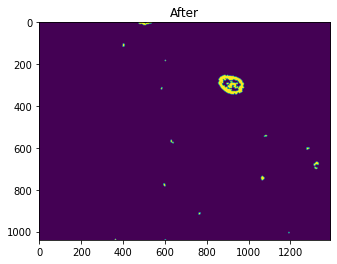

In [65]:
# improve the masks
test = training_masks[0]
plt.figure()
plt.title('Before')
plt.imshow(np.squeeze(test))
# plt.savefig(os.path.join(log_dir,"before_dilation.png"),bbox_inches='tight', dpi=300)
# run["model/samples/before_dilation"].upload(os.path.join(log_dir,"before_dilation.png"))

footprint = disk(3)
test = dilation(np.squeeze(test), footprint)


plt.figure()
plt.title('After')
plt.imshow(np.squeeze(test))
# plt.savefig(os.path.join(log_dir,"after_dilation.png"),bbox_inches='tight', dpi=300)
# run["model/samples/after_dilation"].upload(os.path.join(log_dir,"after_dilation.png"))

In [66]:
# run["model/parameters/before_dilation"].upload(os.path.join(log_dir,"before_dilation.png"))
# run["model/parameters/after_dilation"].upload(os.path.join(log_dir,"after_dilation.png"))

In [67]:
for i in range(training_masks.shape[0]):
    training_masks[i,:,:,0] = dilation(np.squeeze(training_masks[i,:,:,0]), footprint)

for i in range(test_masks.shape[0]):
    test_masks[i,:,:,0] = dilation(np.squeeze(test_masks[i,:,:,0]), footprint)

In [23]:
# Data augmentation

img_gen_args = dict(samplewise_center=True,
                    samplewise_std_normalization=True,
                    vertical_flip=True,
                    horizontal_flip=True,
                    fill_mode='nearest',
                    tif_image_type = 'image',
                    target_width = 256,
                    target_height = 256
                     )

mask_gen_args = dict(samplewise_center=False,
                     samplewise_std_normalization=False,
                     vertical_flip=True,
                     horizontal_flip=True,
                     preprocessing_function=np.rint,
                     fill_mode='nearest',
                     tif_image_type = 'mask',
                     max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256
                    )

image_datagen = customImageDataGenerator(**img_gen_args)
mask_datagen = customImageDataGenerator(**mask_gen_args)



In [24]:
seed = 123
image_datagen.fit(x=training_imgs, augment=True, seed = seed)
mask_datagen.fit(x=training_masks, augment=True, seed = seed)

In [43]:
image_generator = image_datagen.flow(training_imgs, batch_size=batch_size, seed=seed)
mask_generator = mask_datagen.flow(training_masks, batch_size=batch_size, seed=seed)

gen_train = zip(image_generator, mask_generator)

In [36]:
img_gen_args_test = dict(samplewise_center=True,
                     samplewise_std_normalization=True,
                     vertical_flip=True,
                     horizontal_flip=True,
                     fill_mode='nearest',
                     tif_image_type = 'image',
                    target_width = 256,
                    target_height = 256
                     )

mask_gen_args_test = dict(samplewise_center=False,
                     samplewise_std_normalization=False,
                     vertical_flip=True,
                     horizontal_flip=True,
                     preprocessing_function=np.rint,
                     fill_mode='nearest',
                     tif_image_type = 'mask',
                     max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256
                    )

image_datagen_test = customImageDataGenerator(**img_gen_args_test)
mask_datagen_test = customImageDataGenerator(**mask_gen_args_test)

seed = 123
image_datagen_test.fit(test_imgs, augment=True, seed=seed)
mask_datagen_test.fit(test_masks, augment=True, seed=seed)

image_generator_test = image_datagen_test.flow(test_imgs, batch_size=batch_size, seed=seed)
mask_generator_test = mask_datagen_test.flow(test_masks, batch_size=batch_size, seed=seed)

gen_test = zip(image_generator_test, mask_generator_test)

In [40]:
type(gen_test)

zip

In [37]:
print(tf.shape(mask_generator.next()))

tf.Tensor([  7 256 256   1], shape=(4,), dtype=int32)


In [41]:
epochs = 10

In [42]:
history = model.fit(
        gen_train,
        batch_size = batch_size,
        steps_per_epoch=training_imgs.shape[0] // batch_size, #200, 40
        epochs=epochs,
        validation_freq = 1,
        validation_data=gen_test, validation_steps=1,
        callbacks=callbacksList)



Epoch 1/10
1/1 [==============================] - 2s 2s/step - loss: 1.0000 - dice_coeff: 4.3909e-06 - val_loss: 1.0000 - val_dice_coeff: 8.4051e-06
Epoch 2/10
1/1 [==============================] - 1s 1s/step - loss: 1.0000 - dice_coeff: 4.3945e-06 - val_loss: 1.0000 - val_dice_coeff: 8.5524e-06
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 1.0000 - dice_coeff: 4.3945e-06 - val_loss: 1.0000 - val_dice_coeff: 8.7059e-06
Epoch 4/10
1/1 [==============================] - 2s 2s/step - loss: 1.0000 - dice_coeff: 4.3856e-06 - val_loss: 1.0000 - val_dice_coeff: 9.3525e-06
Epoch 5/10
1/1 [==============================] - 1s 1s/step - loss: 1.0000 - dice_coeff: 4.4160e-06 - val_loss: 1.0000 - val_dice_coeff: 9.2455e-06
Epoch 6/10
1/1 [==============================] - 1s 1s/step - loss: 1.0000 - dice_coeff: 4.4110e-06 - val_loss: 1.0000 - val_dice_coeff: 9.2824e-06
Epoch 7/10
1/1 [==============================] - 1s 1s/step - loss: 1.0000 - dice_coeff: 4.3821e-06 - val

In [31]:
# run["model/evaluation/loss"] = history.history['loss']
# run["model/evaluation/dice_coeff"] = history.history['dice_coeff']
# run["model/evaluation/val_loss"] = history.history['val_loss']
# run["model/evaluation/val_dice_coeff"] = history.history['val_dice_coeff']

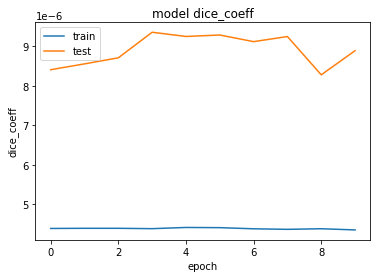

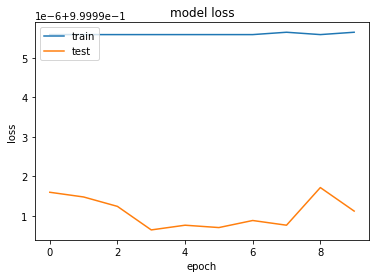

In [44]:
# summarize history for accuracy
plt.plot(history.history['dice_coeff'])
plt.plot(history.history['val_dice_coeff'])
plt.title('model dice_coeff')
plt.ylabel('dice_coeff')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'dice_coeff.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/dice_coeff"].upload(os.path.join(log_dir,"dice_coeff.png"))

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'loss.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/loss"].upload(os.path.join(log_dir,"loss.png"))

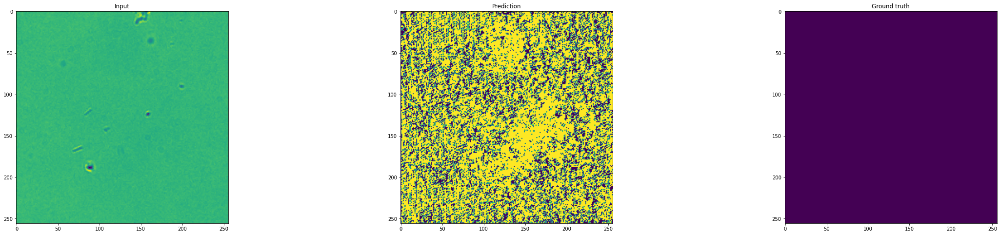

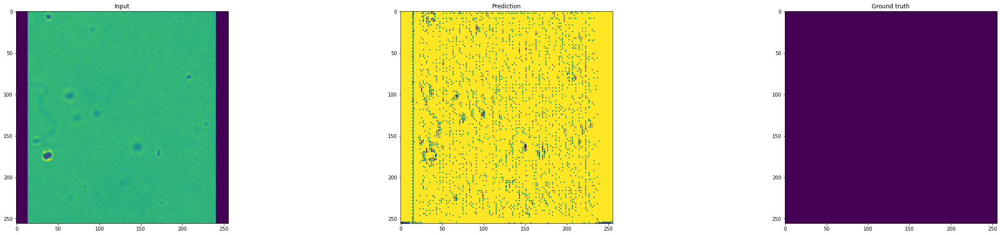

In [43]:
img_exmp = image_generator.next()
mask_exmp = mask_generator.next()
test_model(model, img_exmp, mask_exmp, log_dir)

test_img_exmp = image_generator_test.next()
test_mask_exmp = mask_generator_test.next()
test_model(model, test_img_exmp, test_mask_exmp, log_dir)

In [33]:
# run["model/evaluation/test_output"].upload(os.path.join(log_dir,"ground_truth_etest.png"))

In [34]:
model.save(os.path.join(log_dir,runningTime+'.h5'))

# run["model/saved_model"].upload(os.path.join(log_dir,runningTime+'.h5'))

In [35]:
from tensorflow import keras

reloaded_model = keras.models.load_model(os.path.join(log_dir,runningTime+'.h5'),custom_objects = {"dice_loss": unet7.dice_loss, "dice_coeff": unet7.dice_coeff})
reloaded_model.summary()

Model: "Unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image_input (InputLayer)       [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 8)  80          ['image_input[0][0]']            
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 8)  32         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                               

In [36]:
# run.stop()

#### Combined mask and image as part of the same generator

In [68]:
from custom_keras_class_v2 import *

In [69]:
# Data augmentation of training images and masks

# sets defining what which transformations are applicable to which
image_tf = dict(samplewise_center=True,
                samplewise_std_normalization=True,
                vertical_flip=True,
                horizontal_flip=True,
                preprocessing_function=False,
                fill_mode=True,
                max_iter = True,
                thresh_obj_perc = True,
                target_width = True,
                target_height = True
                    
                )
mask_tf = dict(samplewise_center=False,
                samplewise_std_normalization=False,
                vertical_flip=True,
                horizontal_flip=True,
                preprocessing_function=True,
                fill_mode=True,
                max_iter = True,
                thresh_obj_perc = True,
                target_width = True,
                target_height = True
                    
                )

img_mask_gen_args = dict(samplewise_center=True,
                    samplewise_std_normalization=True,
                    vertical_flip=True,
                    horizontal_flip=True,
                    preprocessing_function=np.rint,
                    fill_mode='nearest',
                    max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256,
                    image_aug_check = image_tf,
                    mask_aug_check = mask_tf
                     )

image_mask_datagen = customImageDataGenerator(**img_mask_gen_args)

seed = 123
image_mask_datagen.fit(training_imgs,image_tf,augment=True, seed=seed)
image_mask_generator = image_mask_datagen.flow(training_imgs,training_masks, batch_size=batch_size, seed=seed)

In [70]:
# Data augmentation of test images and masks

img_mask_gen_args_test = dict(samplewise_center=True,
                    samplewise_std_normalization=True,
                    vertical_flip=True,
                    horizontal_flip=True,
                    preprocessing_function=np.rint,
                    fill_mode='nearest',
                    max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256,
                    image_aug_check = image_tf,
                    mask_aug_check = mask_tf
                     )

image_mask_datagen_test = customImageDataGenerator(**img_mask_gen_args_test)

seed = 123
image_mask_datagen_test.fit(test_imgs,image_tf, augment=True, seed=seed)
image_mask_generator_test = image_mask_datagen_test.flow(test_imgs,test_masks, batch_size=batch_size, seed=seed)

In [71]:
print(tf.shape(image_mask_generator.next()))

tf.Tensor([  2   7 256 256   1], shape=(5,), dtype=int32)


In [72]:
print(tf.shape(image_mask_generator_test.next()))

tf.Tensor([  2   3 256 256   1], shape=(5,), dtype=int32)


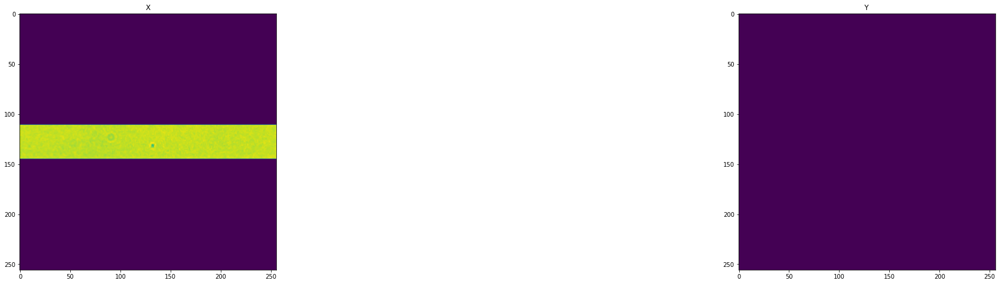

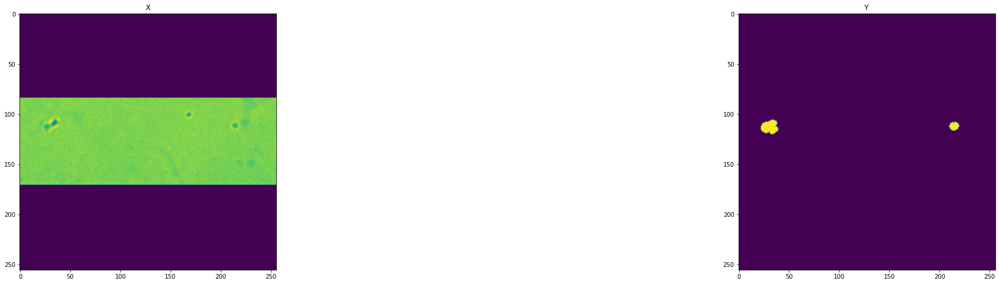

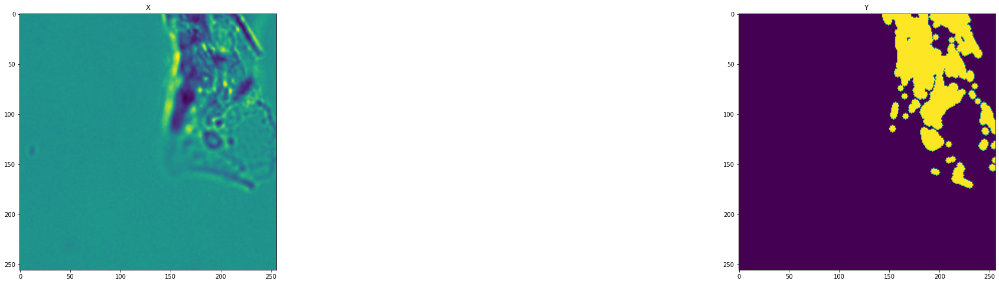

In [73]:
result = image_mask_generator_test.next()
test_img_exmp, test_mask_exmp = result[0], result[1]

for i in range(test_img_exmp.shape[0]):
    x = test_img_exmp[i]
    y = test_mask_exmp[i]
    plt.figure(figsize=(40,8))
    plt.subplot(1, 2, 1)
    plt.title('X')
    plt.imshow(np.squeeze(x))

    plt.subplot(1, 2, 2)
    plt.title('Y')
    plt.imshow(np.squeeze(y))

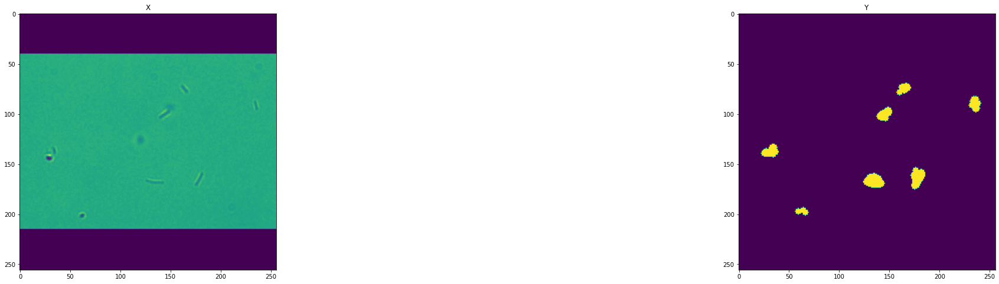

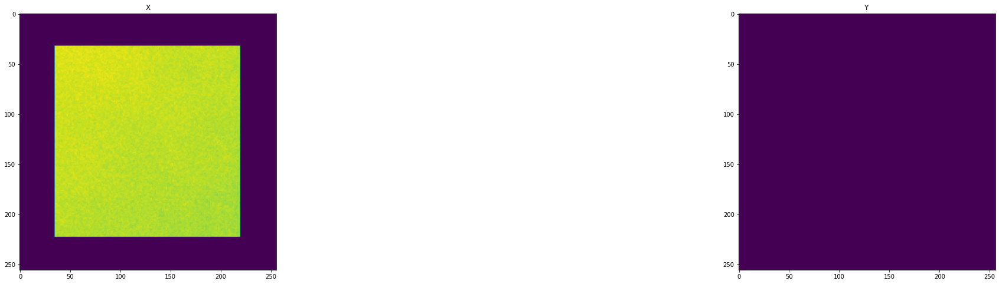

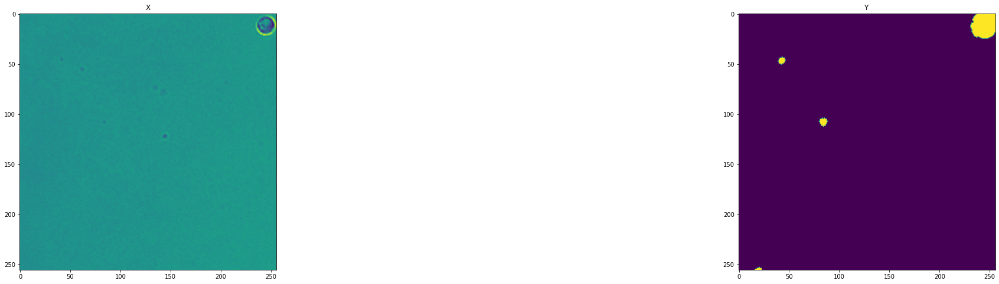

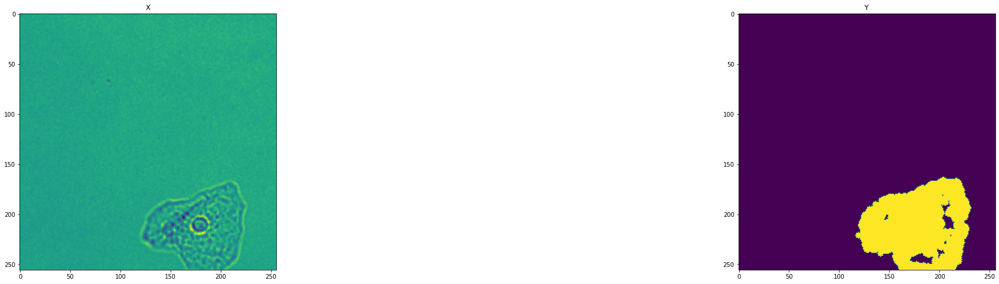

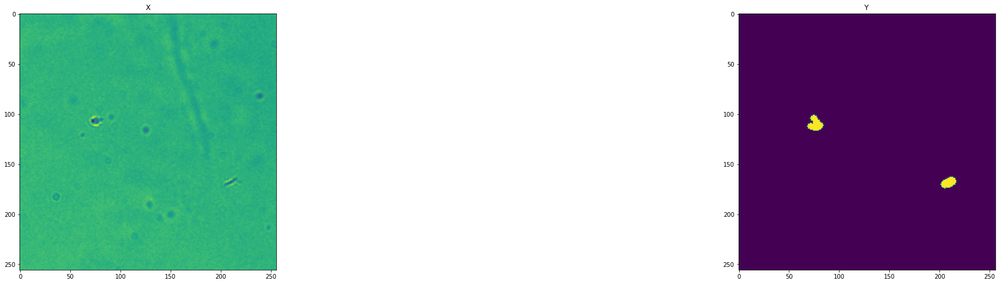

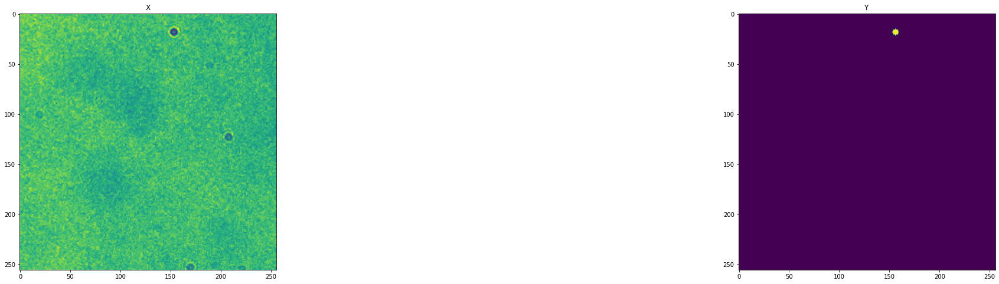

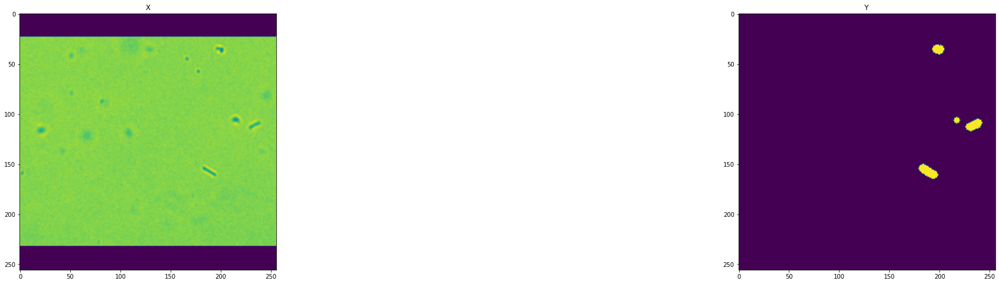

In [82]:
result = image_mask_generator.next()
test_img_exmp, test_mask_exmp = result[0], result[1]

for i in range(test_img_exmp.shape[0]):
    x = test_img_exmp[i]
    y = test_mask_exmp[i]
    plt.figure(figsize=(40,8))
    plt.subplot(1, 2, 1)
    plt.title('X')
    plt.imshow(np.squeeze(x))

    plt.subplot(1, 2, 2)
    plt.title('Y')
    plt.imshow(np.squeeze(y))

In [74]:
history = model.fit(
        image_mask_generator,
        batch_size = batch_size,
        steps_per_epoch=training_imgs.shape[0] // batch_size, #200, 40
        epochs=epochs,
        validation_freq = 1,
        validation_data=image_mask_generator_test, validation_steps=1,
        callbacks=callbacksList)


Epoch 1/10
1/1 [==============================] - 2s 2s/step - loss: 0.9324 - dice_coeff: 0.0676 - val_loss: 0.9410 - val_dice_coeff: 0.0590
Epoch 2/10
1/1 [==============================] - 2s 2s/step - loss: 0.9644 - dice_coeff: 0.0356 - val_loss: 0.9233 - val_dice_coeff: 0.0767
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 0.9321 - dice_coeff: 0.0679 - val_loss: 0.9211 - val_dice_coeff: 0.0789
Epoch 4/10
1/1 [==============================] - 3s 3s/step - loss: 0.9584 - dice_coeff: 0.0416 - val_loss: 0.9184 - val_dice_coeff: 0.0816
Epoch 5/10
1/1 [==============================] - 3s 3s/step - loss: 0.9595 - dice_coeff: 0.0405 - val_loss: 0.9795 - val_dice_coeff: 0.0205
Epoch 6/10
1/1 [==============================] - 2s 2s/step - loss: 0.9319 - dice_coeff: 0.0681 - val_loss: 0.8561 - val_dice_coeff: 0.1439
Epoch 7/10
1/1 [==============================] - 2s 2s/step - loss: 0.9354 - dice_coeff: 0.0646 - val_loss: 0.9425 - val_dice_coeff: 0.0575
Epoch 8/10
1/

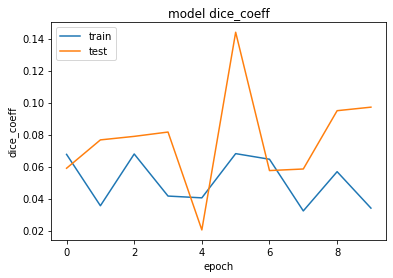

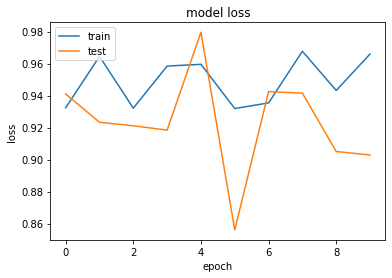

In [75]:
# summarize history for accuracy
plt.plot(history.history['dice_coeff'])
plt.plot(history.history['val_dice_coeff'])
plt.title('model dice_coeff')
plt.ylabel('dice_coeff')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'dice_coeff.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/dice_coeff"].upload(os.path.join(log_dir,"dice_coeff.png"))

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'loss.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/loss"].upload(os.path.join(log_dir,"loss.png"))

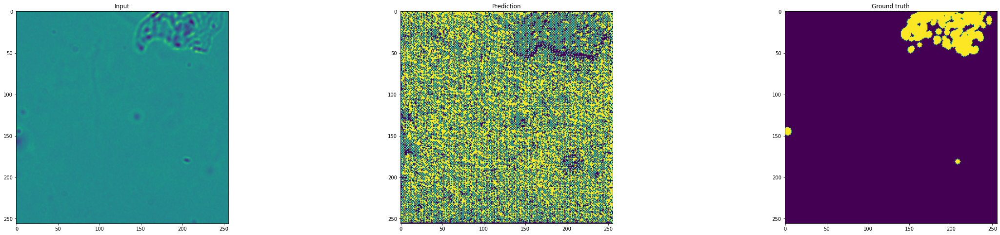

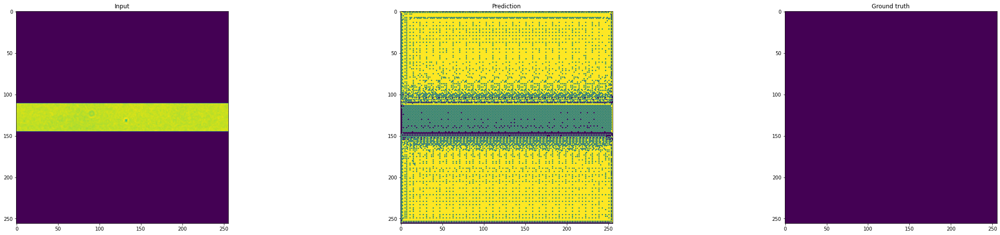

In [76]:
result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, img_exmp, mask_exmp, log_dir)

result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, test_img_exmp, test_mask_exmp, log_dir)

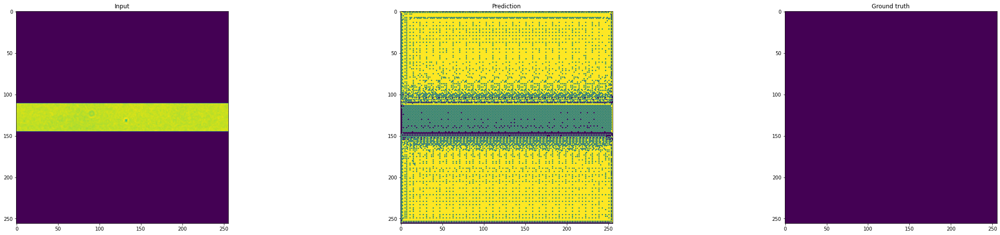

In [77]:
result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, test_img_exmp, test_mask_exmp, log_dir)

In [78]:
# run["model/evaluation/test_output"].upload(os.path.join(log_dir,"ground_truth_etest.png"))

In [ ]:
model.save(os.path.join(log_dir,runningTime+'.h5'))

# run["model/saved_model"].upload(os.path.join(log_dir,runningTime+'.h5'))

In [ ]:
from tensorflow import keras

reloaded_model = keras.models.load_model(os.path.join(log_dir,runningTime+'.h5'),custom_objects = {"dice_loss": unet7.dice_loss, "dice_coeff": unet7.dice_coeff})
reloaded_model.summary()

In [ ]:
# run.stop()

#### Custom function for flow_from_directory() with image and mask as part of same generator

In [83]:
#target_size for flow_from_directory() should be the original size and later 
# on will get into patches following the arguments in the image data generator

from custom_keras_class_v2 import *

In [84]:
# Data augmentation of training images and masks

# sets defining what which transformations are applicable to which
image_tf = dict(samplewise_center=True,
                samplewise_std_normalization=True,
                vertical_flip=True,
                horizontal_flip=True,
                preprocessing_function=False,
                fill_mode=True,
                max_iter = True,
                thresh_obj_perc = True,
                target_width = True,
                target_height = True
                    
                )
mask_tf = dict(samplewise_center=False,
                samplewise_std_normalization=False,
                vertical_flip=True,
                horizontal_flip=True,
                preprocessing_function=True,
                fill_mode=True,
                max_iter = True,
                thresh_obj_perc = True,
                target_width = True,
                target_height = True
                    
                )

img_mask_gen_args = dict(samplewise_center=True,
                    samplewise_std_normalization=True,
                    vertical_flip=True,
                    horizontal_flip=True,
                    preprocessing_function=np.rint,
                    fill_mode='nearest',
                    max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256,
                    image_aug_check = image_tf,
                    mask_aug_check = mask_tf
                     )

image_mask_datagen = customImageDataGenerator(**img_mask_gen_args)

seed = 123
image_mask_datagen.fit(training_imgs,image_tf,augment=True, seed=seed)
image_mask_generator = image_mask_datagen.flow_from_directory(
        directory_x = '../../ucl/dataset1-img',
        directory_y = '../../ucl/dataset1-processed_mask',
        target_size=(1040,1392),
        color_mode="grayscale",
        classes=None,
        class_mode=None,
        batch_size=10,
        seed=seed,
        keep_aspect_ratio=True)

Found 10089 images belonging to 1 classes.


In [89]:
# Data augmentation of test images and masks

img_mask_gen_args_test = dict(samplewise_center=True,
                    samplewise_std_normalization=True,
                    vertical_flip=True,
                    horizontal_flip=True,
                    preprocessing_function=np.rint,
                    fill_mode='nearest',
                    max_iter = 10,
                    thresh_obj_perc = 0.25,
                    target_width = 256,
                    target_height = 256,
                    image_aug_check = image_tf,
                    mask_aug_check = mask_tf
                     )

image_mask_datagen_test = customImageDataGenerator(**img_mask_gen_args_test)

seed = 123
image_mask_datagen_test.fit(test_imgs,image_tf, augment=True, seed=seed)
image_mask_generator_test = image_mask_datagen_test.flow_from_directory(
        directory_x = '../../ucl/Groundtruth 1/Groundtruth 1/img',
        directory_y = '../../ucl/Groundtruth 1/Groundtruth 1/mask',
        target_size= (1040, 1392),
        color_mode="grayscale",
        classes=None,
        class_mode=None,
        batch_size=10,
        seed=seed,
        keep_aspect_ratio=True)

Found 100 images belonging to 1 classes.


In [90]:
print(tf.shape(image_mask_generator.next()))

tf.Tensor([  2  10 256 256   1], shape=(5,), dtype=int32)


In [91]:
print(tf.shape(image_mask_generator_test.next()))

tf.Tensor([  2  10 256 256   1], shape=(5,), dtype=int32)


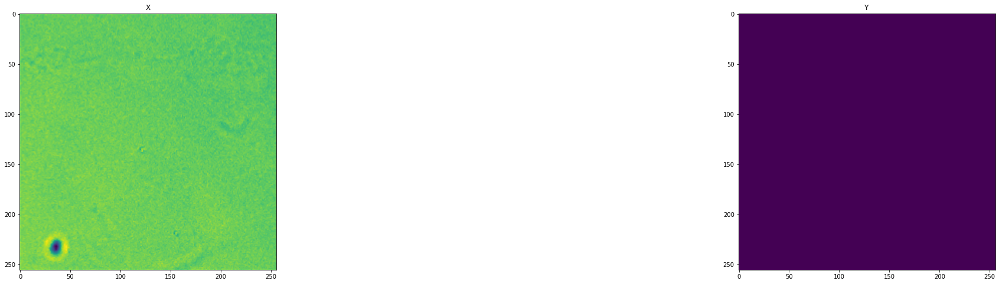

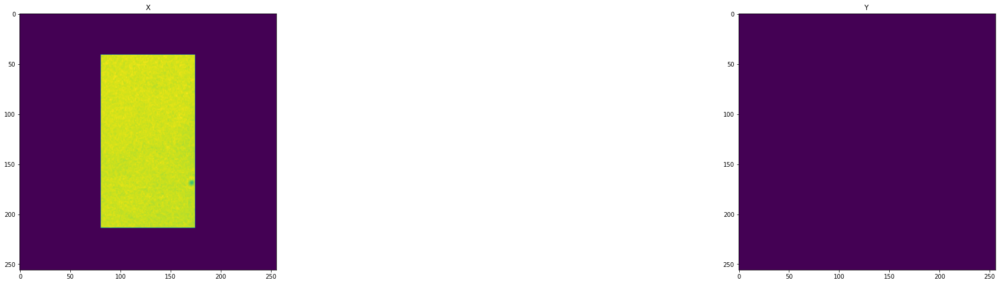

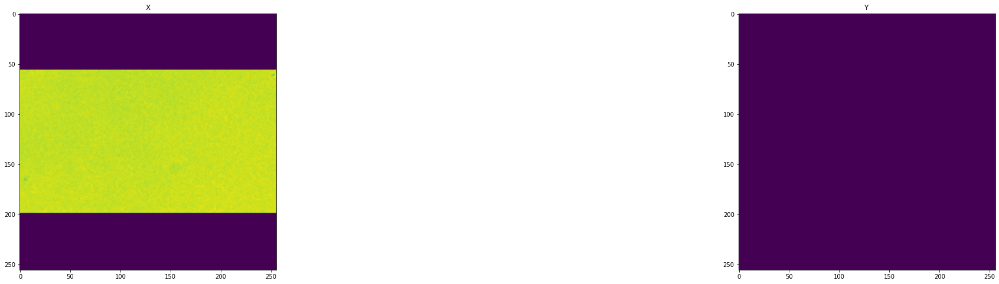

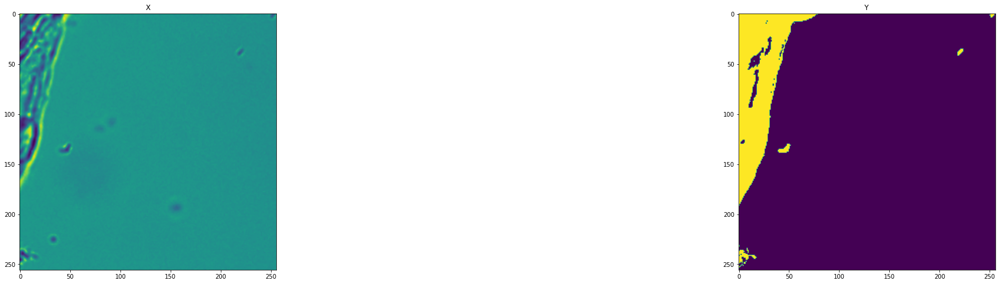

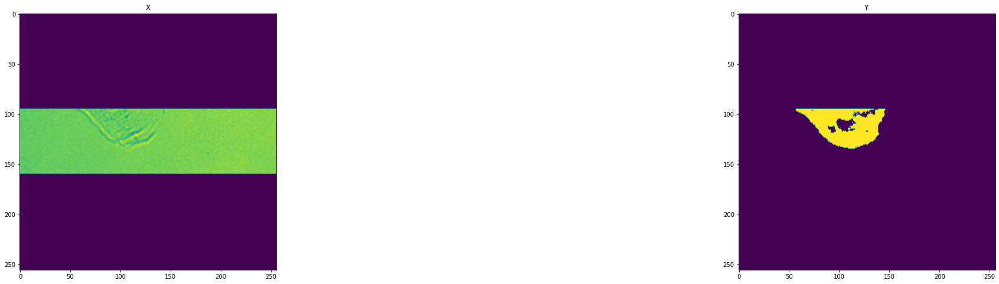

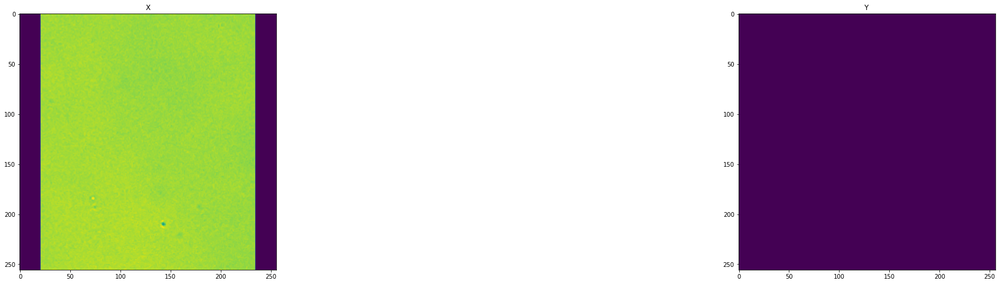

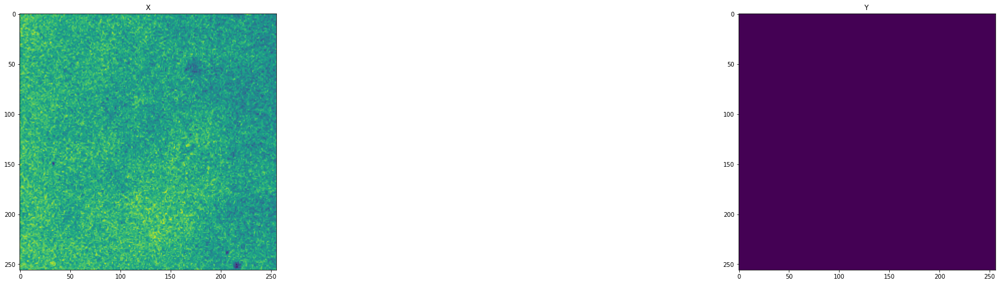

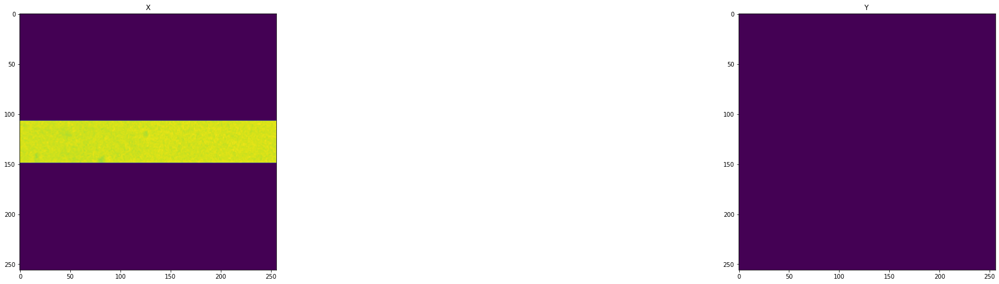

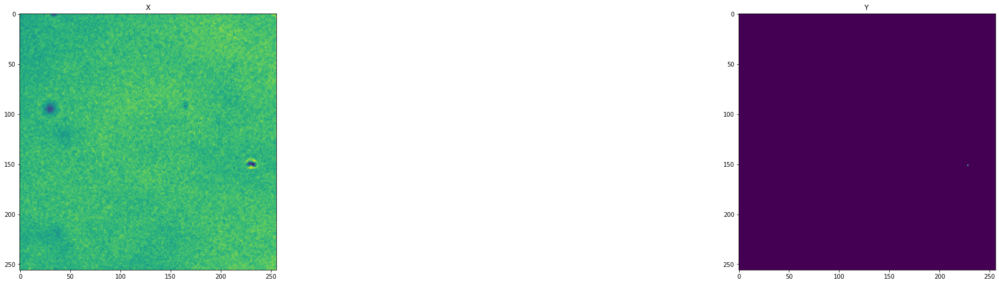

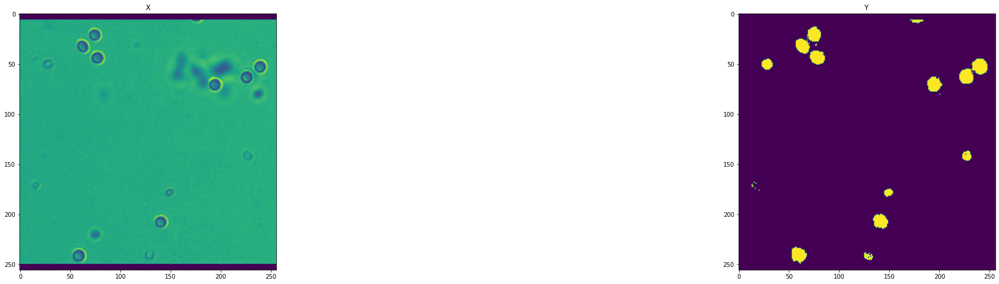

In [93]:
result = image_mask_generator_test.next()
test_img_exmp, test_mask_exmp = result[0], result[1]

for i in range(test_img_exmp.shape[0]):
    x = test_img_exmp[i]
    y = test_mask_exmp[i]
    plt.figure(figsize=(40,8))
    plt.subplot(1, 2, 1)
    plt.title('X')
    plt.imshow(np.squeeze(x))

    plt.subplot(1, 2, 2)
    plt.title('Y')
    plt.imshow(np.squeeze(y))

In [94]:
history = model.fit(
        image_mask_generator,
        batch_size = 10,
        steps_per_epoch=image_mask_generator.next()[0].shape[0] // 10, #200, 40
        epochs=epochs,
        validation_freq = 1,
        validation_data=image_mask_generator_test, validation_steps=1,
        callbacks=callbacksList)

Epoch 1/10
1/1 [==============================] - 7s 7s/step - loss: 0.1768 - dice_coeff: 0.8232 - val_loss: 0.0823 - val_dice_coeff: 0.9177
Epoch 2/10
1/1 [==============================] - 9s 9s/step - loss: 0.1209 - dice_coeff: 0.8791 - val_loss: 0.1249 - val_dice_coeff: 0.8751
Epoch 3/10
1/1 [==============================] - 10s 10s/step - loss: 0.1711 - dice_coeff: 0.8289 - val_loss: 0.0791 - val_dice_coeff: 0.9209
Epoch 4/10
1/1 [==============================] - 9s 9s/step - loss: 0.1908 - dice_coeff: 0.8092 - val_loss: 0.0610 - val_dice_coeff: 0.9390
Epoch 5/10
1/1 [==============================] - 9s 9s/step - loss: 0.1023 - dice_coeff: 0.8977 - val_loss: 0.0012 - val_dice_coeff: 0.9988
Epoch 6/10
1/1 [==============================] - 12s 12s/step - loss: 0.0390 - dice_coeff: 0.9610 - val_loss: 0.0571 - val_dice_coeff: 0.9429
Epoch 7/10
1/1 [==============================] - 12s 12s/step - loss: 0.0179 - dice_coeff: 0.9821 - val_loss: 0.0471 - val_dice_coeff: 0.9529
Epoch 8

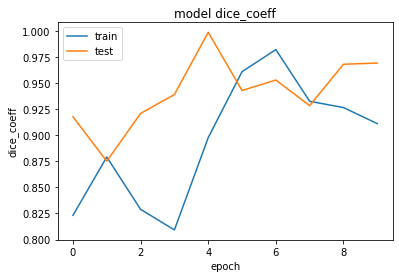

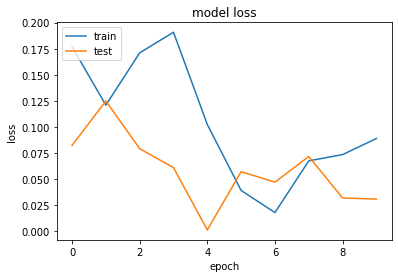

In [95]:
# summarize history for accuracy
plt.plot(history.history['dice_coeff'])
plt.plot(history.history['val_dice_coeff'])
plt.title('model dice_coeff')
plt.ylabel('dice_coeff')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'dice_coeff.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/dice_coeff"].upload(os.path.join(log_dir,"dice_coeff.png"))

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig(os.path.join(log_dir,'loss.png'), bbox_inches='tight', dpi=300)
plt.show()
# run["model/evaluation/loss"].upload(os.path.join(log_dir,"loss.png"))

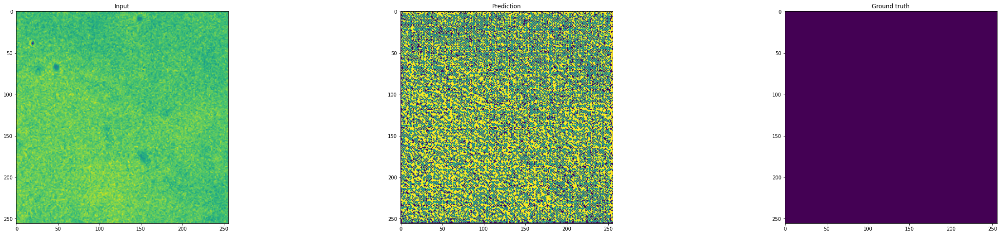

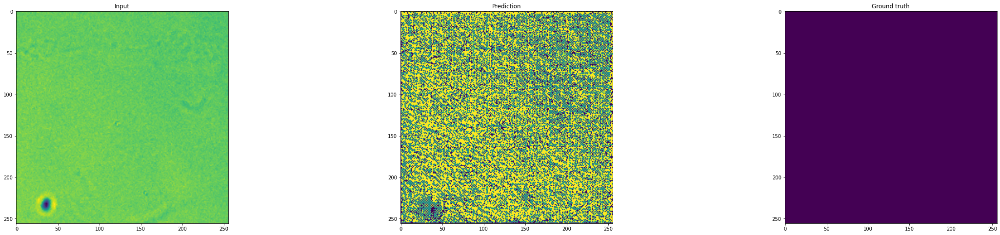

In [96]:
result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, img_exmp, mask_exmp, log_dir)

result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, test_img_exmp, test_mask_exmp, log_dir)

In [107]:
def test_model(model, x, y_true, log_dir):
    y_true = y_true[0]
    y_pred = model.predict(x)
    y_pred = y_pred[0]
    x = x[0]

    plt.figure(figsize=(40,8))
    plt.subplot(1, 3, 1)
    plt.title('Input')
    plt.imshow(x)

    plt.subplot(1, 3, 2)
    plt.title('Prediction')
    plt.imshow(y_pred)

    plt.subplot(1, 3, 3)
    plt.title('Ground truth')
    plt.imshow(y_true)

    plt.savefig(os.path.join(log_dir,'ground_truth_e{}.png'.format('test')), bbox_inches='tight', dpi=300)
    plt.show()

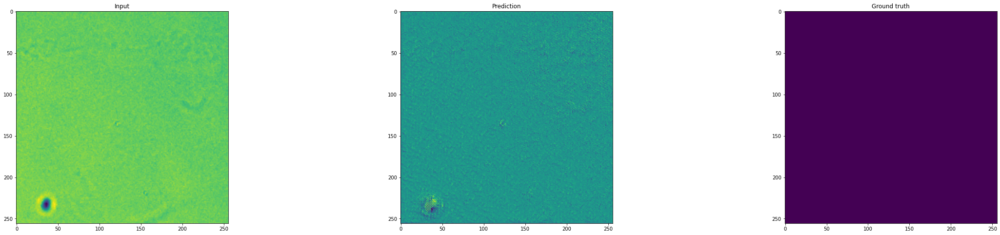

In [108]:
result = image_mask_generator_test.next()
img_exmp, mask_exmp = result[0], result[1]
test_model(model, test_img_exmp, test_mask_exmp, log_dir)

In [43]:
# run["model/evaluation/test_output"].upload(os.path.join(log_dir,"ground_truth_etest.png"))

In [100]:
model.save(os.path.join(log_dir,runningTime+'.h5'))

# run["model/saved_model"].upload(os.path.join(log_dir,runningTime+'.h5'))

In [101]:
from tensorflow import keras

reloaded_model = keras.models.load_model(os.path.join(log_dir,runningTime+'.h5'),custom_objects = {"dice_loss": unet7.dice_loss, "dice_coeff": unet7.dice_coeff})
reloaded_model.summary()

Model: "Unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image_input (InputLayer)       [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 256, 256, 8)  80          ['image_input[0][0]']            
                                                                                                  
 batch_normalization_19 (BatchN  (None, 256, 256, 8)  32         ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                               

In [ ]:
# run.stop()
